In [74]:
# Import Libraries

import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8) #Configure default plot settings and adjust the appearance of plots created in a Python environment.

# Read in the data

df = pd.read_csv(r'C:\Users\Funmi\Desktop\Datasets\movies.csv')

In [120]:
# Load and examine the data

df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,CorrectYear
0,The Shining,R,Drama,1980,"June 13, 1980",8.4,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980",5.8,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980",8.7,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980",7.7,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980",7.3,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98,1980


In [3]:
# Check for missing data
# Iterate over each column in the to check for missing values(PERCENT).

for col in df.columns:
    missing_count = df[col].isnull().sum()
    missing_percent = missing_count / len(df) * 100
    print(f'{col} - {missing_percent:.0f}%')

name - 0%
rating - 1%
genre - 0%
year - 0%
released - 0%
score - 0%
votes - 0%
director - 0%
writer - 0%
star - 0%
country - 0%
budget - 28%
gross - 2%
company - 0%
runtime - 0%


In [4]:
# Count of missing values

print(df.isnull().sum())

name           0
rating        77
genre          0
year           0
released       2
score          3
votes          3
director       0
writer         3
star           1
country        3
budget      2171
gross        189
company       17
runtime        4
dtype: int64


In [5]:
# Data Types for each columns

df.dtypes

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object

In [116]:
# Looking at the top 15 companies by gross revenue

CompanyGrossSum = df.groupby(['company', 'year'])[["gross"]].sum()

CompanyGrossSumSorted = CompanyGrossSum.sort_values(['gross','company','year'], ascending = False)[:15]

CompanyGrossSumSorted = CompanyGrossSumSorted['gross'].astype('int64') 

CompanyGrossSumSorted

company                year
Walt Disney Pictures   2019    5773131804
Marvel Studios         2018    4018631866
Universal Pictures     2015    3834354888
Twentieth Century Fox  2009    3793491246
Walt Disney Pictures   2017    3789382071
Paramount Pictures     2011    3565705182
Warner Bros.           2010    3300479986
                       2011    3223799224
Walt Disney Pictures   2010    3104474158
Paramount Pictures     2014    3071298586
Columbia Pictures      2006    2934631933
                       2019    2932757449
Marvel Studios         2019    2797501328
Warner Bros.           2018    2774168962
Columbia Pictures      2011    2738363306
Name: gross, dtype: int64

In [114]:
df.groupby(['company', 'year'])[["gross"]].sum()

gross
company                                            year            
"DIA" Productions GmbH & Co. KG                    2003    44350926
"Weathering With You" Film Partners                2019   193457467
.406 Production                                    1996       10580
1+2 Seisaku Iinkai                                 2000     1196218
10 West Studios                                    2010      814906
120 Films                                          2002     6479328
120dB Films                                        2009       26676
                                                   2016      368372
13 Productions                                     2000       25461
1492 Pictures                                      1996   129832389
                                                   1999    87423861
1818 Productions                                   1983    12232628
19 Entertainment                                   2003     4928883
1978 Films                                         2017    40656399
1984 Private Defense Contractors                   2014    58834384
1992 Number Four Limited Partnership               1995     4686937
2 Loop Films                                       2002      264349
2.0 Entertainment                                  2019   122810399
2.4.7. Films                                       2007    22783978
2003 Productions                                   2004    69424389
20th Century Studios                               2020   111105497
21 Laps Entertainment                              2014    41296320
                                                   2018    41142379
21st Century Film Corporation                      1989     3953745
                                                   1990     7658401
21st Century Films                                 1994     1702394
25th Hour Productions                              2002    23932055
26 Films                                           2009    20458873
2929 Productions                                   2007     7248490
                                                   2008    28705178
                                                   2014     5092129
2DUX²                                              2016      678150
                                                   2018   197744377
3 Arts Entertainment                               1996    60209334
                                                   1997    75812433
                                                   2001    71186502
                                                   2010      649626
                                                   2013     3909596
                                                   2014   161459297
                                                   2015    36606743
                                                   2019    22386555
3 Miles Apart Productions Ltd.                     1999     8408835
3311 Productions                                   2013     3114953
                                                   2017     5042014
360 Pictures                                       2007     9669758
391 Productions                                    1998     1960216
                                                   1999       92442
3B Productions                                     1999    78500541
                                                   2003      167999
3Mark Entertainment                                2001     4760014
4 1/2 Film                                         2006     1297260
4 Kids Entertainment                               1999   133949270
40 Acres & A Mule Filmworks                        1986     7137502
                                                   1989    37295445
                                                   1995    15403436
                                                   1999    34573780
                                                   2000    27728118
                                                  

<AxesSubplot:>

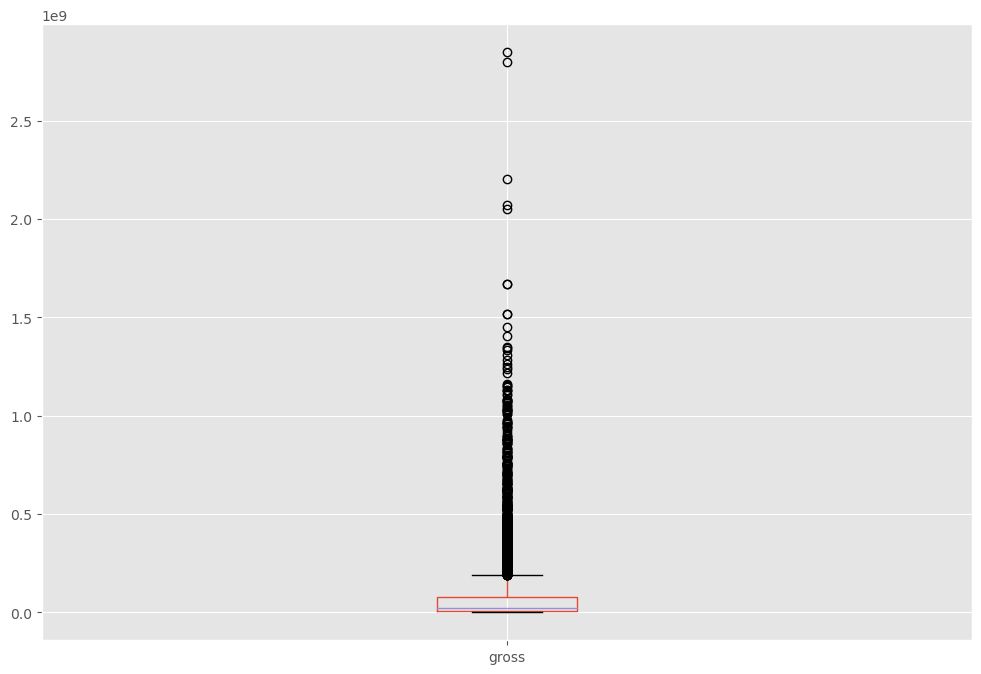

In [117]:
# Are there any Outliers?

df.boxplot(column=['gross'])

In [11]:
# Calculate mean values for 'budget' and 'gross' columns
budget_mean = df['budget'].mean()
gross_mean = df['gross'].mean()

# Replace missing values in 'budget' and 'gross' columns with the mean values
df['budget'].fillna(budget_mean, inplace=True)
df['gross'].fillna(gross_mean, inplace=True)

# Format values in 'budget' and 'gross' columns to two decimal places
df['budget'] = df['budget'].apply(lambda x: '{:.2f}'.format(x))
df['gross'] = df['gross'].apply(lambda x: '{:.2f}'.format(x))

In [12]:
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.00,46998772.00,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.00,58853106.00,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.00,538375067.00,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.00,83453539.00,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.00,39846344.00,Orion Pictures,98.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7663,More to Life,NaN,Drama,2020,"October 23, 2020 (United States)",3.1,18.0,Joseph Ebanks,Joseph Ebanks,Shannon Bond,United States,7000.00,78500541.02,NaN,90.0
7664,Dream Round,NaN,Comedy,2020,"February 7, 2020 (United States)",4.7,36.0,Dusty Dukatz,Lisa Huston,Michael Saquella,United States,35589876.19,78500541.02,Cactus Blue Entertainment,90.0
7665,Saving Mbango,NaN,Drama,2020,"April 27, 2020 (Cameroon)",5.7,29.0,Nkanya Nkwai,Lynno Lovert,Onyama Laura,United States,58750.00,78500541.02,Embi Productions,NaN
7666,It's Just Us,NaN,Drama,2020,"October 1, 2020 (United States)",NaN,NaN,James Randall,James Randall,Christina Roz,United States,15000.00,78500541.02,NaN,120.0


In [86]:
# Populate missing values in the data

# Replace missing values in object data type columns with the mode    
df.select_dtypes(include=['object']).columns
for col in df.columns:
    df[col].fillna(df[col].mode()[0], inplace=True)

In [121]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,CorrectYear
0,The Shining,R,Drama,1980,"June 13, 1980",8.4,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980",5.8,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980",8.7,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980",7.7,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980",7.3,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98,1980


In [88]:
# Modifying Column datatype in the data

df['budget'] = df['budget'].astype('float')
df['gross'] = df['gross'].astype('float')

df['budget'] = df['budget'].astype('int64')
df['gross'] = df['gross'].astype('int64')

df['votes'] = df['votes'].astype('float')
df['runtime'] = df['runtime'].astype('float')

df['votes'] = df['votes'].astype('int64')
df['runtime'] = df['runtime'].astype('int64')

In [122]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,CorrectYear
0,The Shining,R,Drama,1980,"June 13, 1980",8.4,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980",5.8,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980",8.7,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980",7.7,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980",7.3,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98,1980


In [123]:
# Create 'correct_year' that has the same year as the 'released' column.

df['released'] = df['released'].str.replace('(United States)', "", regex=True)

df['released'] = df['released'].str.replace(r"\s*\(.*?\)\s*", "", regex=True)

df['CorrectYear'] = df['released'].str[-4:]

df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,CorrectYear
0,The Shining,R,Drama,1980,"June 13, 1980",8.4,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980",5.8,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980",8.7,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980",7.7,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980",7.3,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98,1980


In [124]:
# Order our Data a little bit to see

pd.set_option('display.max_rows', None)

df.sort_values(by=['gross'], inplace=False, ascending=False).head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,CorrectYear
5445,Avatar,PG-13,Action,2009,"December 18, 2009",7.8,1100000,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162,2009
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019",8.4,903000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181,2019
3045,Titanic,PG-13,Drama,1997,"December 19, 1997",7.8,1100000,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194,1997
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015",7.8,876000,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138,2015
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018",8.4,897000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149,2018


In [80]:
#Remove duplicate data

df.drop_duplicates()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,CorrectYear
0,The Shining,R,Drama,1980,"June 13, 1980",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,4.699877e+07,Warner Bros.,146.0,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,5.885311e+07,Columbia Pictures,104.0,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,5.383751e+08,Lucasfilm,124.0,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,8.345354e+07,Paramount Pictures,88.0,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,3.984634e+07,Orion Pictures,98.0,1980
5,Friday the 13th,R,Horror,1980,"May 9, 1980",6.4,123000.0,Sean S. Cunningham,Victor Miller,Betsy Palmer,United States,550000.0,3.975460e+07,Paramount Pictures,95.0,1980
6,The Blues Brothers,R,Action,1980,"June 20, 1980",7.9,188000.0,John Landis,Dan Aykroyd,John Belushi,United States,27000000.0,1.152299e+08,Universal Pictures,133.0,1980
7,Raging Bull,R,Biography,1980,"December 19, 1980",8.2,330000.0,Martin Scorsese,Jake LaMotta,Robert De Niro,United States,18000000.0,2.340243e+07,Chartoff-Winkler Productions,129.0,1980
8,Superman II,PG,Action,1980,"June 19, 1981",6.8,101000.0,Richard Lester,Jerry Siegel,Gene Hackman,United States,54000000.0,1.081857e+08,Dovemead Films,127.0,1981
9,The Long Riders,R,Biography,1980,"May 16, 1980",7.0,10000.0,Walter Hill,Bill Bryden,David Carradine,United States,10000000.0,1.579519e+07,United Artists,100.0,1980


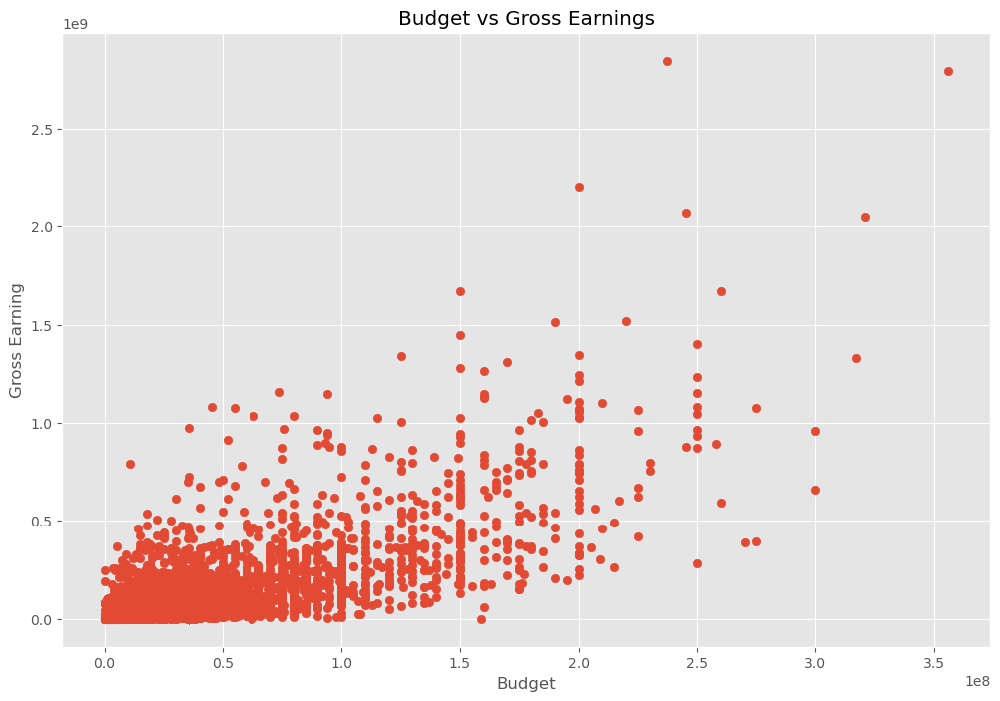

In [61]:
# Create a Scatter plot of budget vs gross

plt.scatter(x=df['budget'], y=df['gross'])

plt.title('Budget vs Gross Earnings')
plt.xlabel('Budget')
plt.ylabel('Gross Earning')

plt.show()

<AxesSubplot:xlabel='gross', ylabel='budget'>

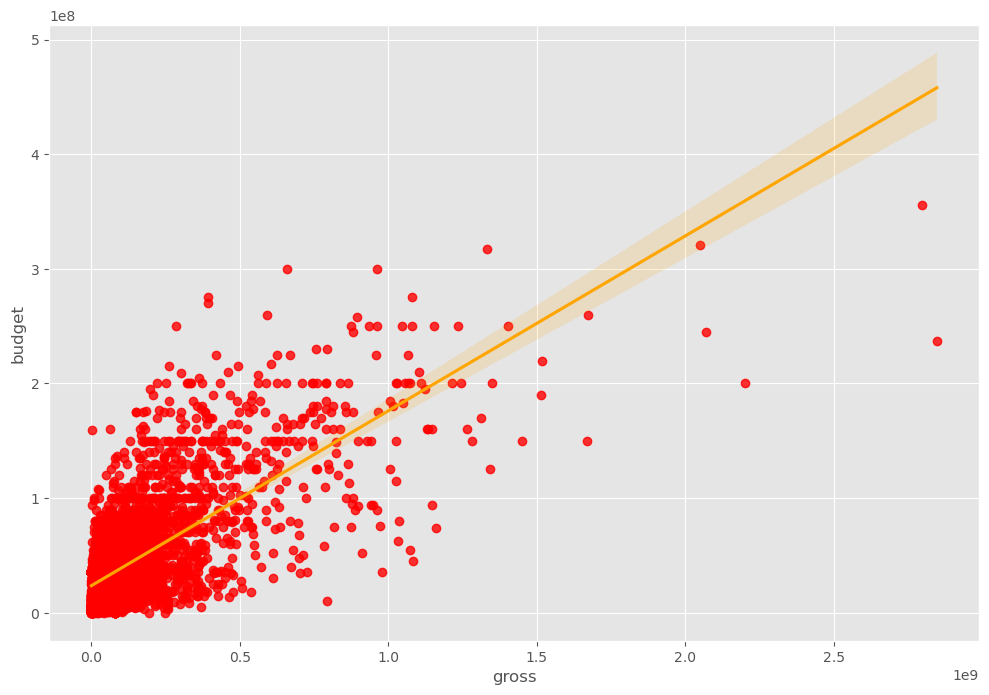

In [63]:
# plot budget vs gross using seaborn

sns.regplot(x="gross", y="budget", data=df, scatter_kws={'color': 'red'}, line_kws={'color': 'orange'})

In [66]:
# Let's start examining the correlation.

df.corr(method='pearson')

,year,score,votes,budget,gross,runtime
year,1.000000,0.098084,0.222485,0.265578,0.252042,0.120431
score,0.098084,1.000000,0.409123,0.064455,0.182866,0.399543
votes,0.222485,0.409123,1.000000,0.421170,0.628687,0.309150
budget,0.265578,0.064455,0.421170,1.000000,0.711270,0.265330
gross,0.252042,0.182866,0.628687,0.711270,1.000000,0.241334
runtime,0.120431,0.399543,0.309150,0.265330,0.241334,1.000000


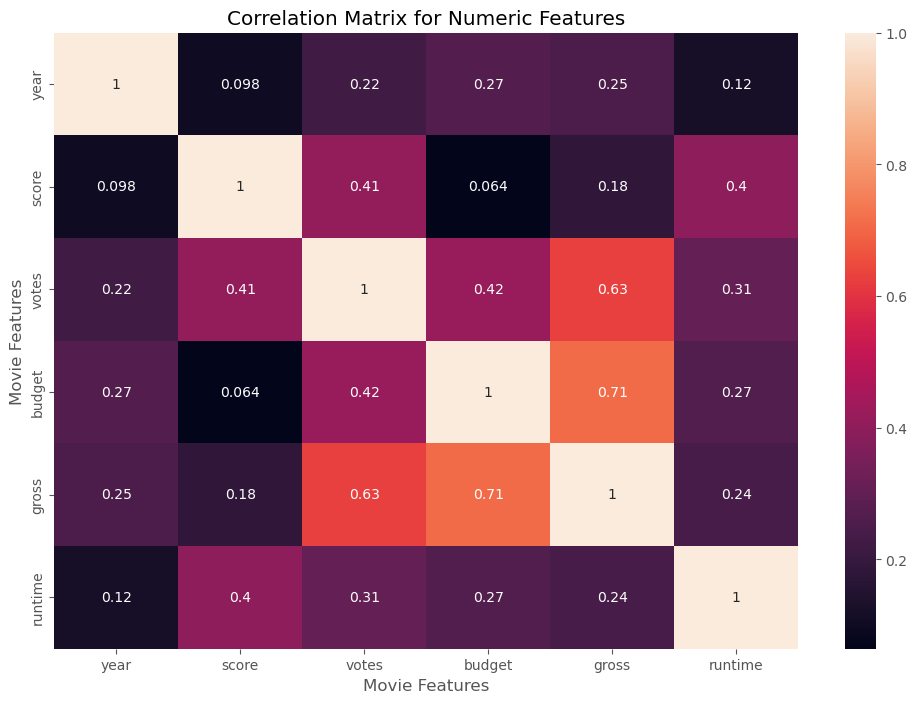

In [70]:
correlation_matrix = df.corr(method='pearson')

sns.heatmap(correlation_matrix, annot=True)

plt.title('Correlation Matrix for Numeric Features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')

plt.show()

In [125]:
# Converting categorical value into numerical format - this assigns a random numeric value for each unique categorical value

df_numerized = df.copy()

for col_name in df_numerized.select_dtypes(include='object').columns:
    df_numerized[col_name] = df_numerized[col_name].astype('category').cat.codes

df_numerized = df_numerized.sort_values(df_numerized.columns[0], ascending=False)

df_numerized.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,CorrectYear
4722,7511,5,0,2005,626,5.5,125000,1561,3406,400,55,62000000,53321673,1812,93,25
4761,7510,5,0,2005,175,4.5,68000,1676,3522,1022,55,113000000,71022693,731,101,25
7112,7509,5,0,2017,1085,5.2,88000,541,3522,2721,8,85000000,346118277,1812,107,37
4083,7508,5,0,2002,520,5.9,175000,2336,3522,2721,55,70000000,277448382,1966,124,22
3503,7507,6,10,1999,129,6.8,96000,612,950,1373,54,15000000,2856712,858,97,19


In [106]:
df_numerized.corr()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,CorrectYear
name,1.000000,-0.012441,0.016355,0.011453,-0.010997,0.017114,0.013045,0.009079,0.010018,0.006749,-0.010425,0.020368,0.005466,0.010369,0.010214,0.010379
rating,-0.012441,1.000000,0.123465,0.027931,0.022764,0.013304,0.012253,0.016255,-0.002795,0.005314,0.026930,-0.156544,-0.130083,-0.079626,0.066499,0.028017
genre,0.016355,0.123465,1.000000,-0.081261,0.029215,0.027970,-0.145294,-0.015258,0.006746,-0.004856,-0.035896,-0.310566,-0.230267,-0.070013,-0.052759,-0.078120
year,0.011453,0.027931,-0.081261,1.000000,-0.000620,0.098084,0.222485,-0.020795,-0.007901,-0.027745,-0.069423,0.265578,0.252042,-0.011438,0.120431,0.996802
released,-0.010997,0.022764,0.029215,-0.000620,1.000000,0.042833,0.016945,-0.001289,-0.003491,0.015370,-0.021675,0.013718,0.003124,-0.007935,0.001248,-0.004457
score,0.017114,0.013304,0.027970,0.098084,0.042833,1.000000,0.409123,0.009522,0.019700,-0.001031,-0.134538,0.064455,0.182866,-0.004547,0.399543,0.106290
votes,0.013045,0.012253,-0.145294,0.222485,0.016945,0.409123,1.000000,0.000336,0.000432,-0.019341,0.073500,0.421170,0.628687,0.130533,0.309150,0.217907
director,0.009079,0.016255,-0.015258,-0.020795,-0.001289,0.009522,0.000336,1.000000,0.299512,0.039715,0.017926,-0.010364,-0.014272,0.004250,0.017583,-0.020399
writer,0.010018,-0.002795,0.006746,-0.007901,-0.003491,0.019700,0.000432,0.299512,1.000000,0.028745,0.014409,-0.033217,-0.023186,0.001665,-0.003751,-0.007694
star,0.006749,0.005314,-0.004856,-0.027745,0.015370,-0.001031,-0.019341,0.039715,0.028745,1.000000,-0.014749,-0.016952,-0.002683,0.008072,0.009208,-0.028117


In [108]:
corr_mat = df_numerized.corr()

corr_pairs = corr_mat.unstack()

corr_pairs

name         name           1.000000
             rating        -0.012441
             genre          0.016355
             year           0.011453
             released      -0.010997
             score          0.017114
             votes          0.013045
             director       0.009079
             writer         0.010018
             star           0.006749
             country       -0.010425
             budget         0.020368
             gross          0.005466
             company        0.010369
             runtime        0.010214
             CorrectYear    0.010379
rating       name          -0.012441
             rating         1.000000
             genre          0.123465
             year           0.027931
             released       0.022764
             score          0.013304
             votes          0.012253
             director       0.016255
             writer        -0.002795
             star           0.005314
             country        0.026930
 

In [110]:
sorted_pairs = corr_pairs.sort_values()

sorted_pairs

genre        budget        -0.310566
budget       genre         -0.310566
genre        gross         -0.230267
gross        genre         -0.230267
rating       budget        -0.156544
budget       rating        -0.156544
votes        genre         -0.145294
genre        votes         -0.145294
country      score         -0.134538
score        country       -0.134538
gross        rating        -0.130083
rating       gross         -0.130083
year         genre         -0.081261
genre        year          -0.081261
CorrectYear  country       -0.080221
country      CorrectYear   -0.080221
rating       company       -0.079626
company      rating        -0.079626
country      runtime       -0.079385
runtime      country       -0.079385
genre        CorrectYear   -0.078120
CorrectYear  genre         -0.078120
genre        company       -0.070013
company      genre         -0.070013
year         country       -0.069423
country      year          -0.069423
genre        runtime       -0.052759
r

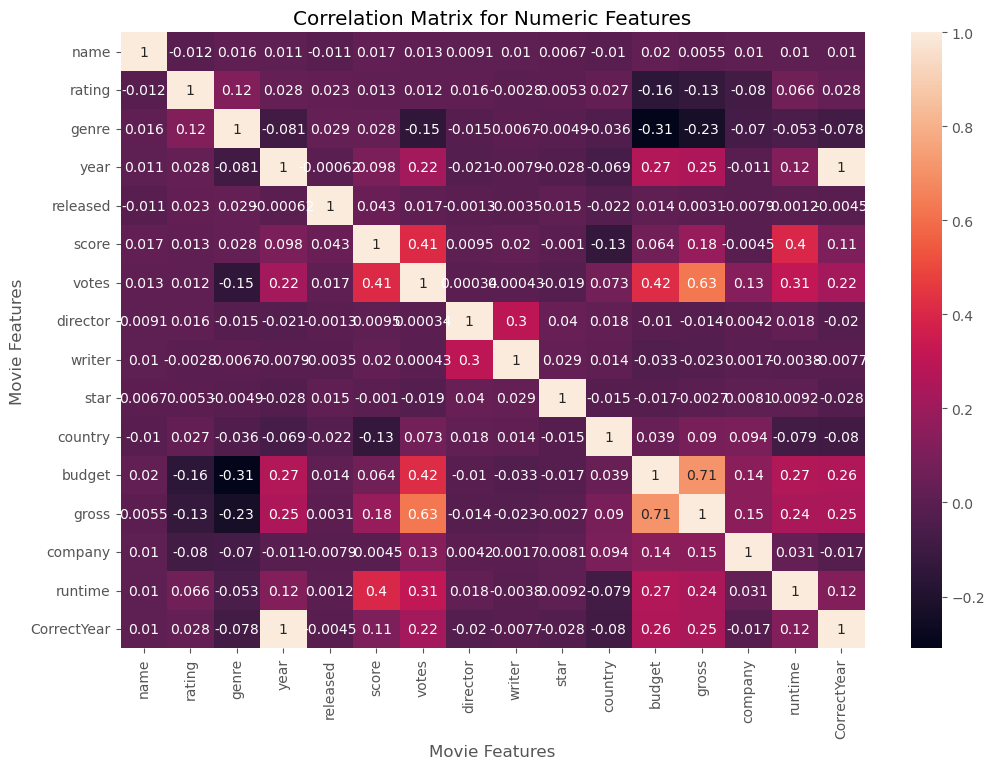

In [107]:
corr_matx = df_numerized.corr()

sns.heatmap(corr_matx, annot=True)

plt.title('Correlation Matrix for Numeric Features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')

plt.show()

In [112]:
high_corr = sorted_pairs[(sorted_pairs) > 0.5]

high_corr

votes        gross          0.628687
gross        votes          0.628687
             budget         0.711270
budget       gross          0.711270
year         CorrectYear    0.996802
CorrectYear  year           0.996802
name         name           1.000000
company      company        1.000000
gross        gross          1.000000
budget       budget         1.000000
country      country        1.000000
star         star           1.000000
writer       writer         1.000000
director     director       1.000000
votes        votes          1.000000
score        score          1.000000
released     released       1.000000
year         year           1.000000
genre        genre          1.000000
rating       rating         1.000000
runtime      runtime        1.000000
CorrectYear  CorrectYear    1.000000
dtype: float64